<a href="https://colab.research.google.com/github/galalqassas/xai/blob/main/notebooks/Random%20Forest/Mohamed_Random_Forest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Take a copy of this notebook for each model you will implement.

This is the initial notebook — any changes will be made here before starting model building to ensure consistency across all notebooks.

**Key Consistency Tips**

* Standardized Headings: Use identical section names across all notebooks.

* Code Comments: Explain non-trivial steps (e.g., "Handling class imbalance with SMOTE").

* Version Control: Add a requirements.txt in the repo for dependency management. مش لازم

* Outputs: Save all plots/figures to a /results folder with consistent naming (e.g., XGBoost_SHAP.png).
اعتقد هتبقى كويسة عشان واحنا بنعمل البيبر ما نقعدش ناخد سكرينات


* Reproducibility: Set global random seeds (e.g., np.random.seed(42)).

# **Imports**

In [73]:
%%capture
!pip install -q lime shap
!pip install PyALE
!pip install git+https://github.com/MaximeJumelle/ALEPython.git@dev#egg=alepython

In [72]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
import kagglehub
from sklearn.model_selection import train_test_split, learning_curve, ValidationCurveDisplay
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, RocCurveDisplay, auc, PrecisionRecallDisplay
from sklearn.inspection import PartialDependenceDisplay
import warnings
from sklearn.ensemble import RandomForestClassifier
warnings.filterwarnings('ignore')
from lime.lime_tabular import LimeTabularExplainer
import shap
from PyALE import ale

# **Utils**

In [53]:
def our_confusion_matrix(model, name='Model'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ConfusionMatrixDisplay.from_estimator(model, X_train, y_train, cmap="Oranges", ax=ax1)
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap="Oranges", ax=ax2)
    plt.title(f"{name} Confusion Matrix")

def our_roc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    roc1 = RocCurveDisplay.from_estimator(
    model, X_train, y_train,
    name=name, ax=ax1,
    color="orange" #juicy juicy
    )
    roc2 = RocCurveDisplay.from_estimator(
        model, X_test, y_test,
        name=name, ax=ax2,
        color="orange" #juicy juicy
    )
    ax1.fill_between(roc1.fpr, roc1.tpr, alpha=0.4, color="orange")
    ax2.fill_between(roc2.fpr, roc2.tpr, alpha=0.4, color="orange")
    ax1.set_title(f"{name} Training ROC Curve", fontsize=16)
    ax2.set_title(f"{name} Testing ROC Curve", fontsize=16)
    for ax in [ax1, ax2]:
        ax.grid(alpha=0.5)

def our_learning_curve(model, name='Model'):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X_train, y_train, cv=5, scoring='accuracy',
        train_sizes=np.linspace(0.1, 1.0, 10), random_state=0
    )

    plt.figure(figsize=(13, 8))
    plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color="mediumseagreen", label="Training score")
    plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color="royalblue", label="Cross-validation score")
    plt.title(f"{name} Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.legend(loc="best")
    plt.grid(alpha=0.5)

def our_prc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 13))
    train_disp = PrecisionRecallDisplay.from_estimator(model, X_train, y_train, ax=ax1, color='orange')
    test_disp = PrecisionRecallDisplay.from_estimator(model, X_test, y_test, ax=ax2, color='orange')
    ax1.set_title(f"{name} Precision-Recall Curve - Train")
    ax2.set_title(f"{name} Precision-Recall Curve - Test")
    ax1.fill_between(train_disp.recall, train_disp.precision, alpha=0.4, color='orange')
    ax2.fill_between(test_disp.recall, test_disp.precision, alpha=0.4, color='orange')

def plot_lime_explanation(model, instance, explainer, feature_names, class_names=None, true_label=None):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))
    if isinstance(instance, pd.Series):
        instance_values = instance.values
    else:
        instance_values = instance
    pred_class = model.predict([instance_values])[0]
    pred_prob = model.predict_proba([instance_values])[0][pred_class]
    exp = explainer.explain_instance(
        instance_values,
        model.predict_proba,
        num_features=10
    )

    ax1.barh(feature_names, instance_values, color='skyblue')
    ax1.set_title('Feature Values')
    ax1.set_xlabel('Value')
    ax1.invert_yaxis()


    lime_features = exp.as_list()
    features = [f[0] for f in lime_features]
    contributions = [f[1] for f in lime_features]
    colors = ['green' if c > 0 else 'red' for c in contributions]

    ax2.barh(features, contributions, color=colors)
    # The following line has been modified to handle the case when true_label is None.
    # If true_label is None, it will be replaced with the predicted class label.
    true_label = true_label if true_label is not None else pred_class
    ax2.set_title(f'LIME Explanation\nPredicted: {class_names[pred_class]} ({pred_class}) ({pred_prob:.2f})\nTrue Label: {class_names[true_label]} ({true_label})')
    ax2.axvline(0, color='black', linestyle='--')
    ax2.set_xlabel('Contribution to Prediction')
    ax2.invert_yaxis()

    plt.tight_layout()
    plt.show()

# **Load Processed Dat**a

In [4]:
path = kagglehub.dataset_download('mohamedhassan77/xai-project-processed-data')
df = pd.read_csv(f"{path}/combined_adasyn_train_test.csv")
df

100%|██████████| 145k/145k [00:00<00:00, 679kB/s]

Extracting files...


,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,promotion_velocity,workload_score,compensation_ratio,Attrition,Set
0,31,2,1062,1,24,3,3,3,0,96,...,3,10.0,9,1,8,9.999900,1,1.019760,0,Train
1,50,2,328,1,1,3,3,3,1,86,...,2,3.0,2,0,2,300000.000000,2,1.281918,0,Train
2,46,2,717,1,13,4,1,3,1,34,...,3,10.0,7,0,9,1000000.000000,1,0.832635,0,Train
3,44,2,170,1,1,4,1,2,1,78,...,3,2.0,0,2,2,0.999995,1,0.753443,0,Train
4,26,1,1479,1,1,3,1,3,0,84,...,1,6.0,5,1,4,5.999940,3,1.007878,0,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,56,2,1162,1,24,2,1,1,1,97,...,3,4.0,2,1,0,3.999960,1,0.898732,1,Test
2043,46,2,669,2,9,2,3,3,1,64,...,3,9.0,8,4,7,2.249994,1,1.558490,1,Test
2044,30,2,1240,0,9,3,0,3,1,48,...,1,11.0,9,4,7,2.749993,7,2.052053,0,Test
2045,31,2,741,1,2,4,1,2,1,69,...,4,5.0,2,0,3,500000.000000,0,1.207921,0,Test


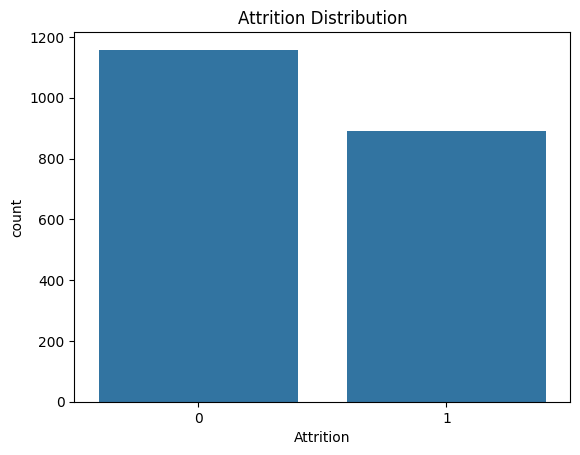

In [5]:
sns.countplot(x='Attrition', data=df)
plt.title('Attrition Distribution')
plt.show()

In [6]:
train_df = df[df['Set'] == 'Train'].drop(columns=['Set'])
test_df = df[df['Set'] == 'Test'].drop(columns=['Set'])

X_train = train_df.drop(columns=['Attrition'])
y_train = train_df['Attrition']

X_test = test_df.drop(columns=['Attrition'])
y_test = test_df['Attrition']

print("X_train:", X_train.shape, "y_train:", y_train.shape)
print("X_test:", X_test.shape, "y_test:", y_test.shape)

X_train: (1589, 33) y_train: (1589,)
X_test: (458, 33) y_test: (458,)


In [46]:
feature_names = X_train.columns

# **Model Initialization**

In [7]:
rf = RandomForestClassifier().fit(X_train, y_train)
rf.score(X_train, y_train), rf.score(X_test, y_test)

(1.0, 0.8209606986899564)

# **Model Evaluation**

In [77]:
y_pred = rf.predict(X_test)
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.94      0.90       373
           1       0.53      0.28      0.37        85

    accuracy                           0.82       458
   macro avg       0.69      0.61      0.63       458
weighted avg       0.79      0.82      0.80       458



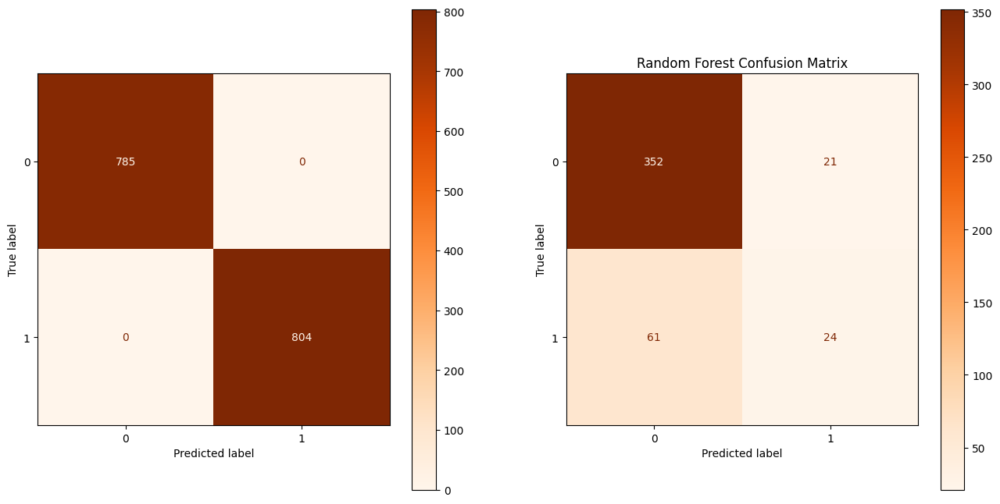

In [8]:
our_confusion_matrix(rf, "Random Forest")

* The model has predicted correctly 352 from 373 from class 0 (No Attrition) but on class 1 it only predicted 24 from 85 correctly.
* It is much better at predicting who will stay than who will leave ( it is biased to class 0)

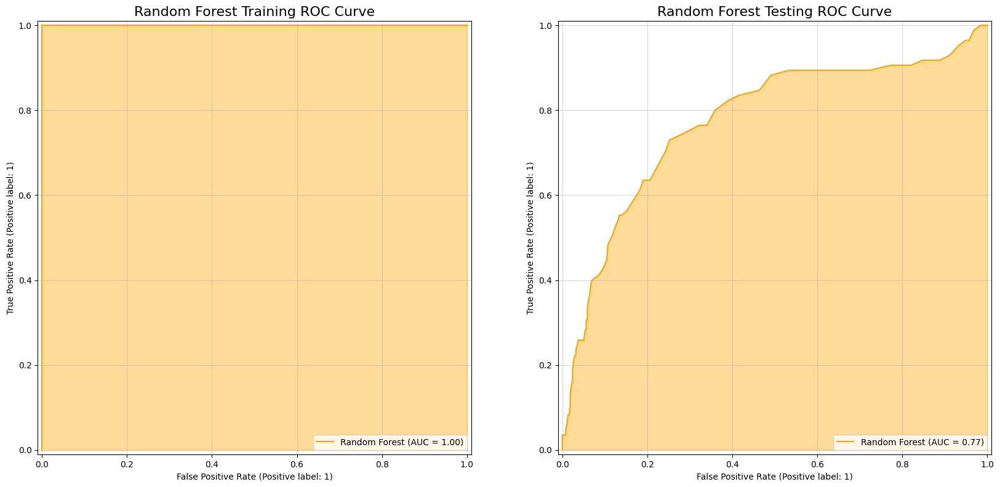

In [9]:
our_roc(rf, "Random Forest")

* There is a noticeable drop in AUC from 1.00 (Training) to 0.77 (Testing). This gap indicates that the Random Forest model is **still overfitting** the training data to some degree.
* However, the testing AUC of 0.77 represents an **acceptable level of generalization** and predictive performance on test datan.


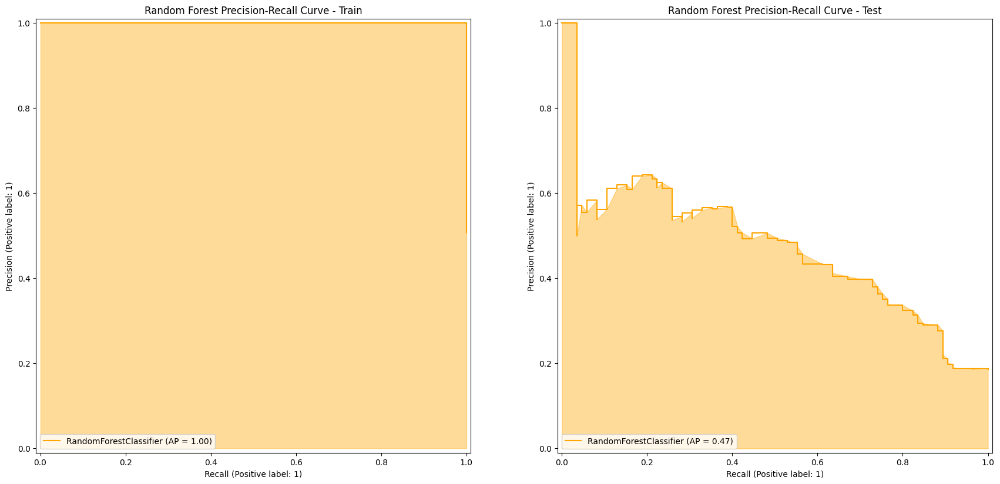

In [10]:
our_prc(rf, "Random Forest")

* The large difference between the training AP (1.00) and the testing AP (0.47) reinforces the conclusion that the Random Forest model is overfitting the training data.

# **Explainability Techniques**

## Partial Dependence Plots (PDP)

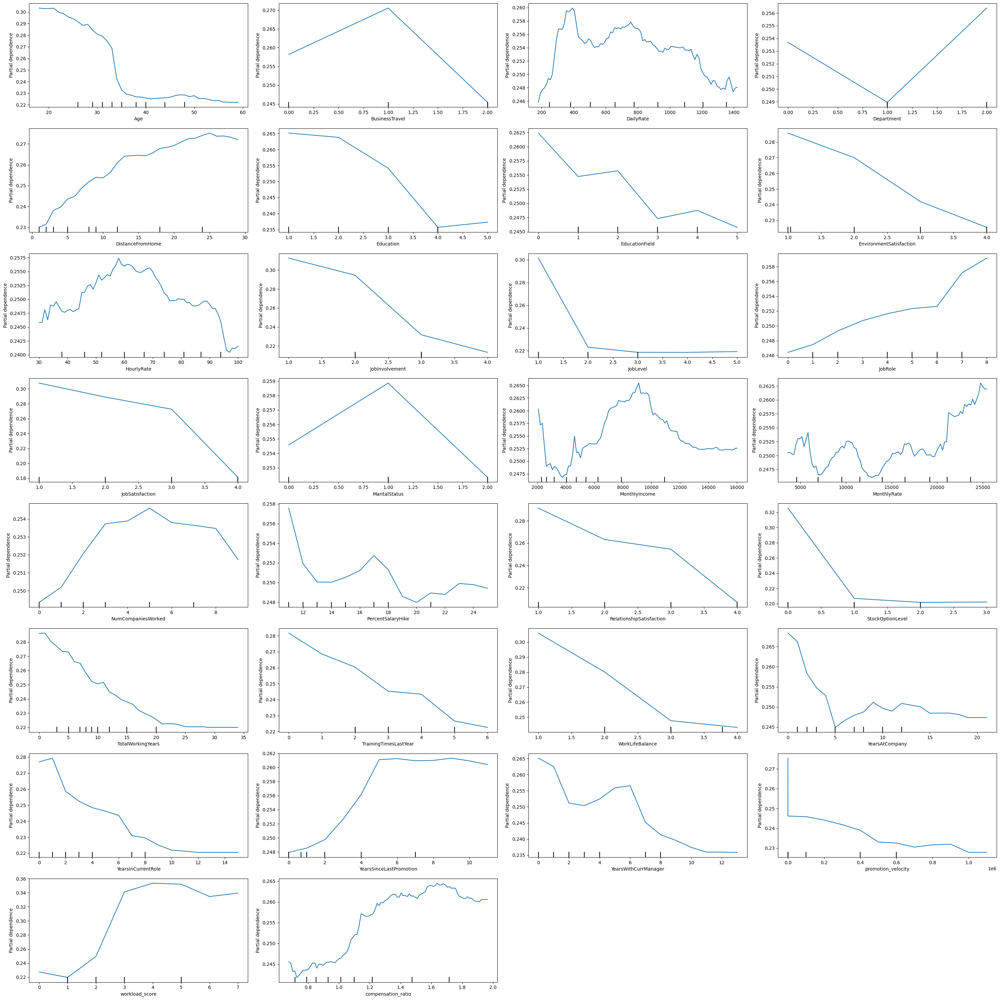

In [20]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(30, 30))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        rf, X_test, [feat], ax=ax)

n_rows = axes.shape[0]
n_cols = axes.shape[1]
for i in range(len(cols), n_rows * n_cols):
     if i < len(axes.flatten()):
        fig.delaxes(axes.flatten()[i])

plt.tight_layout()

* The lines are generally much smoother than the sharp steps seen in the Decision Tree PDPs. This reflects the averaging of predictions from multiple trees, potentially indicating more robust and less overfit relationships.

*   **Satisfaction Metrics (`JobSatisfaction`, `RelationshipSatisfaction`, `EnvironmentSatisfaction`):** Higher satisfaction decreases the average predicted probability of attrition.

*   **Incentives/Compensation (`StockOptionLevel`, `MonthlyIncome`):**
    *   `StockOptionLevel`: shows a significant drop between level 0 and 1, indicating its strong average impact.
    *   `MonthlyIncome`: higher income generally lowers predicted attrition risk on average.

*   **Tenure/Experience (`Age`, `TotalWorkingYears`, `YearsInCurrentRole`, `YearsAtCompany`, `YearsWithCurrManager`):** All plots show smoother downward trends. Increased stability/experience consistently lowers the average predicted attrition probability.

*   **Workload/Engagement (`workload_score`, `JobInvolvement`):**
    *   `JobInvolvement`: Smooth negative correlation.
    *   `workload_score`: non-linear relationship is present

*   **Mobility/History (`NumCompaniesWorked`, `DistanceFromHome`, `YearsSinceLastPromotion`):** Longer distance, more companies worked, and longer time since promotion increase average predicted attrition risk.

*   **Other Features:**
    *   `BusinessTravel`:  1 highest risk, Index 2 lowest.
    *   `HourlyRate`, `DailyRate`, `MonthlyRate`, `PercentSalaryHike`: plots appear noisy with less distinct monotonic trends, suggesting complex average relationships or interactions dominating.
    *   `WorkLifeBalance`: relatively flat, indicating low average marginal impact on the prediction.
    *   `compensation_ratio`: generally increasing trend in average predicted risk.
    *   `promotion_velocity`: Shows a decreasing trend initially.

2 Way PDP

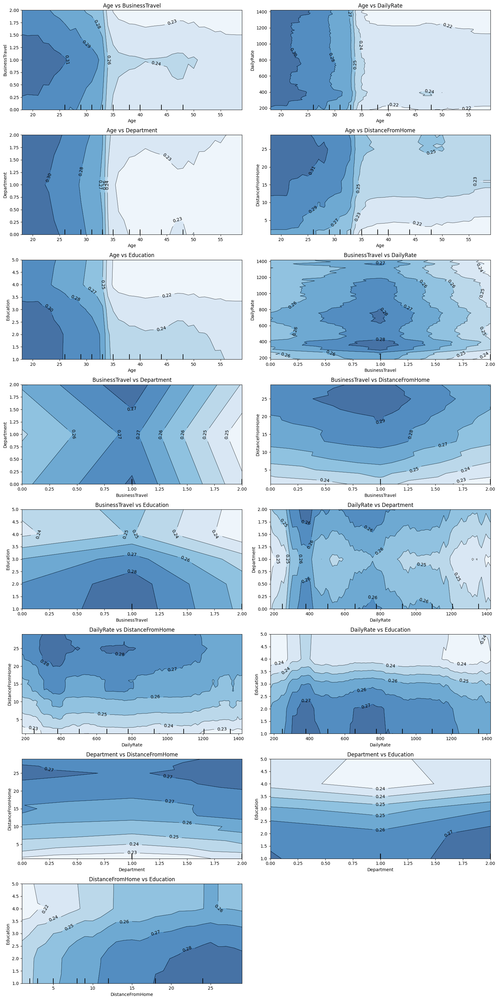

In [19]:
important_features = cols[:6]
feature_pairs = []
for i in range(len(important_features)):
    for j in range(i+1, len(important_features)):
        feature_pairs.append((important_features[i], important_features[j]))

n_pairs = len(feature_pairs)
n_cols = 2
n_rows = (n_pairs + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))

for ax, feat_pair in zip(axes.flatten(), feature_pairs):
    PartialDependenceDisplay.from_estimator(
        rf, X_test, [feat_pair], ax=ax,
        kind='average', contour_kw={'cmap': 'Blues'})
    ax.set_title(f'{feat_pair[0]} vs {feat_pair[1]}')

for i in range(n_pairs, n_rows * n_cols):
     if i < len(axes.flatten()):
        fig.delaxes(axes.flatten()[i])


plt.tight_layout()

**Key Examples:**
*   **`Age` vs `BusinessTravel`:**
    * Attrition risk decreases with age, but frequent travelers (Index 2) show the lowest risk, especially after age 35. Younger non/infrequent travelers (Indices 0–1) face the highest risk.

*   **`Age` vs `DistanceFromHome`:**
    * Longer distance increase risk for employees <33, but have minimal effect for older workers (>35), who already exhibit low attrition risk.

*   **`BusinessTravel` vs `DistanceFromHome`:**
    * infrequent travelers see rising risk with distance, while frequent travelers remain less affected, maintaining low risk across all distances.

*   **`DailyRate` vs `Education`:**
    * Lower education (1–2) with low/medium pay correlates with high attrition risk. Higher education (≥4) reduces risk regardless of pay, diminishing the impact of daily rate.

*   **`DistanceFromHome` vs `Education`:**
    * Short distance (<10) -> higher education (slightly lower risk). Long distance (>15) elevate risk overall, especially for lower-educated employees.

## ICE

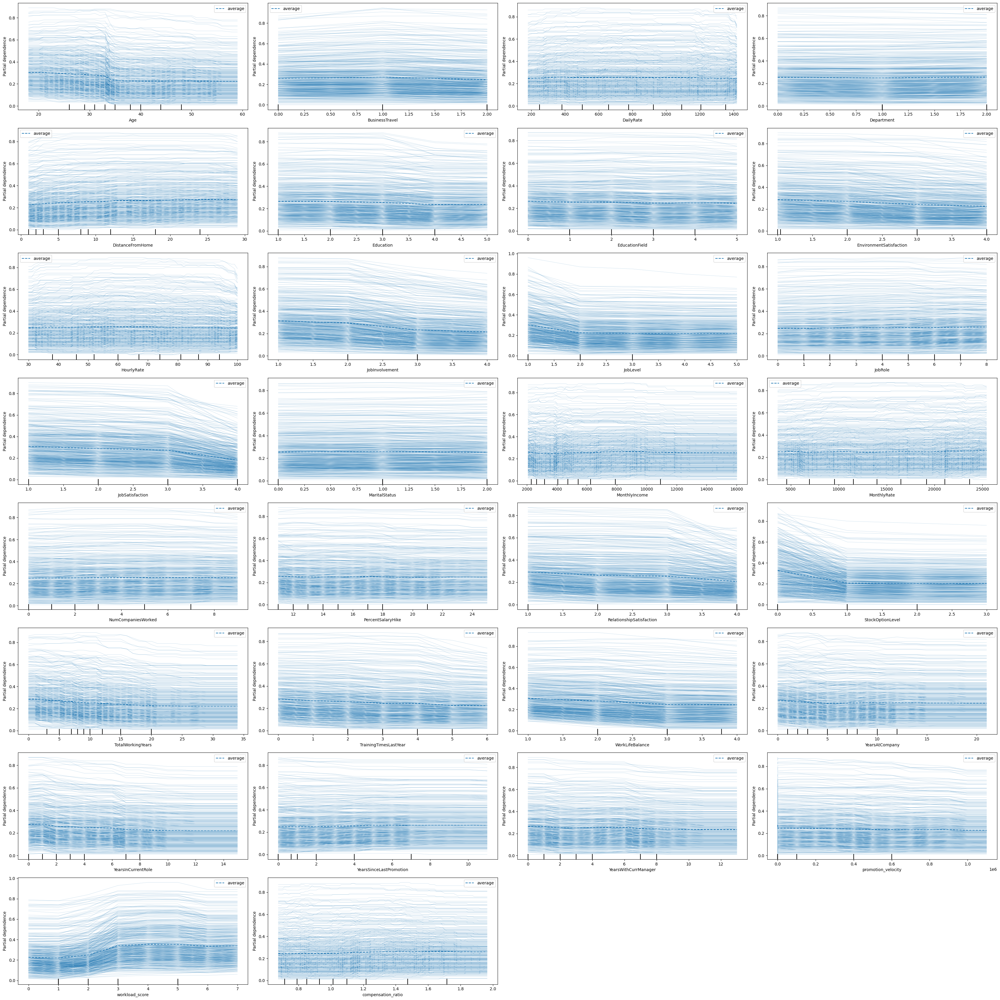

In [21]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(34, 34))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        rf, X_test, [feat], ax=ax, kind='both')

for i in range(len(cols), nr * nc):
    if i < len(axes.flatten()):
        fig.delaxes(axes.flatten()[i])
plt.tight_layout()

The plots reveal significant **heterogeneity**  individual instances respond differently to feature changes due to interaction effects learned by the model. While generally smoother than single Decision Tree ICE lines, the variations show complexity beyond the simple average trend seen in PDPs.

## Feature Importance

[Text(3, 0, '0.005'),
 Text(3, 0, '0.006'),
 Text(3, 0, '0.008'),
 Text(3, 0, '0.008'),
 Text(3, 0, '0.012'),
 Text(3, 0, '0.012'),
 Text(3, 0, '0.014'),
 Text(3, 0, '0.015'),
 Text(3, 0, '0.016'),
 Text(3, 0, '0.016'),
 Text(3, 0, '0.018'),
 Text(3, 0, '0.021'),
 Text(3, 0, '0.022'),
 Text(3, 0, '0.022'),
 Text(3, 0, '0.023'),
 Text(3, 0, '0.028'),
 Text(3, 0, '0.028'),
 Text(3, 0, '0.029'),
 Text(3, 0, '0.030'),
 Text(3, 0, '0.032'),
 Text(3, 0, '0.032'),
 Text(3, 0, '0.032'),
 Text(3, 0, '0.033'),
 Text(3, 0, '0.036'),
 Text(3, 0, '0.037'),
 Text(3, 0, '0.038'),
 Text(3, 0, '0.043'),
 Text(3, 0, '0.050'),
 Text(3, 0, '0.051'),
 Text(3, 0, '0.054'),
 Text(3, 0, '0.065'),
 Text(3, 0, '0.072'),
 Text(3, 0, '0.094')]

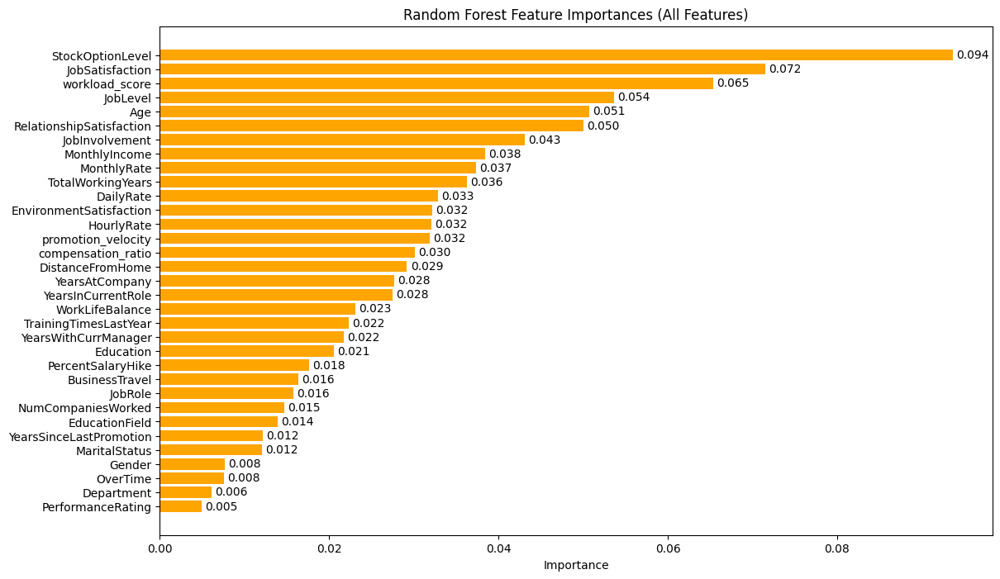

In [15]:
importances = rf.feature_importances_
feat_idx = np.argsort(importances)[::-1]

plt.figure(figsize=(13, 8))
ax = plt.gca()
bars = ax.barh(X_train.columns[feat_idx][::-1], importances[feat_idx][::-1], color="orange")
ax.set_xlabel("Importance")
ax.set_title("Random Forest Feature Importances (All Features)")
ax.bar_label(bars, fmt="%.3f", padding=3, fontsize=10)

The plot shows the important features ranked from most important (Top) till least important (Bottom) according to the Random Forest Model.

## ALE

In [74]:
class ProbaWrapper:
    def __init__(self, m):
         self.m = m
    def predict(self, X):
         return self.m.predict_proba(X)[:,1]

pw = ProbaWrapper(rf)

INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_g

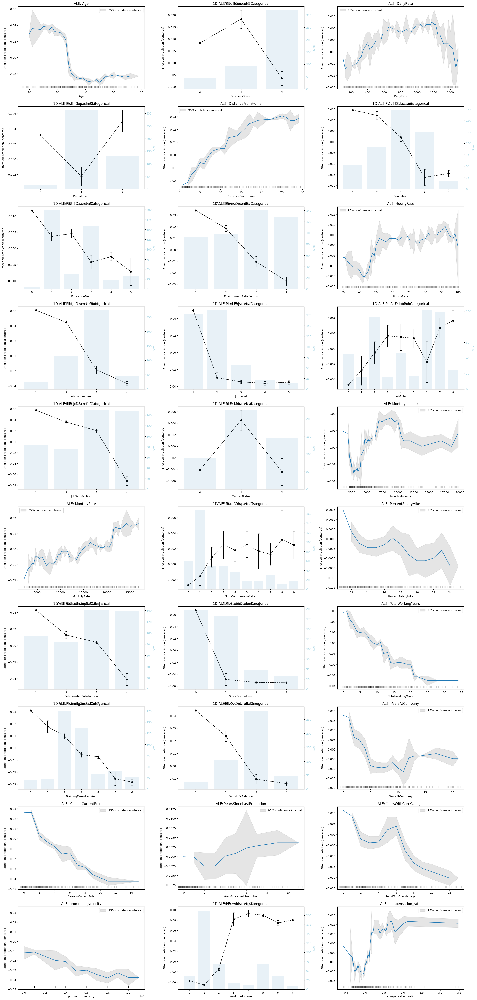

In [76]:
cont = [c for c in X_test.columns if X_test[c].nunique()>2]
n_cols = 3
n_rows = (len(cont) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 5 * n_rows))
axes = axes.flatten()

for ax, feat in zip(axes, cont):
    ale(X=X_test, model=pw, feature=[feat],
        grid_size=50, include_CI=True, C=0.95,
        fig=fig, ax=ax)

    ax.set_title(f"ALE: {feat}")


for ax_unused in axes[len(cont):]:
    ax_unused.set_visible(False)

plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.tight_layout(pad=1.5)
plt.show()

ALE plots show how features affect attrition risk, accounting for feature correlations. It gives less biased insights than standard PDPs

Key insights:

* **Strongest Risk Reduction:** Higher `JobSatisfaction` , `Age (>35)`, `JobLevel` , `WorkLifeBalance` , and `StockOptionLevel > 0` significantly lower risk (SHAP up to to nearly -0.07).
* **Top Risk Drivers:** Increased `DistanceFromHome` , `NumCompaniesWorked`, and `YearsSinceLastPromotion`  raise risk.
* **Non-Linear Patterns:** `Workload_score` peaks at 3-5; `MonthlyIncome` shows mixed trends.
* **Weak/Noisy Effects:** `DailyRate` , `HourlyRate` , and `MonthlyRate` have unstable, near-zero impacts.
* **Categorical:** *Infrequent* `BusinessTravel` (Index 1) increases risk.

Shaded areas = 95% confidence intervals.

## LIME Analysis

In [49]:
class_names = ['No Attrition', 'Attrition']
feature_names = list(X_train.columns)
lime_explainer = LimeTabularExplainer(X_train.values, feature_names =
                                 feature_names,
                                 class_names = class_names,
                                 mode = 'classification')
exp = lime_explainer.explain_instance(
    X_test.values[254],
    rf.predict_proba,
    num_features=len(feature_names)
)
exp.show_in_notebook(show_table=True)

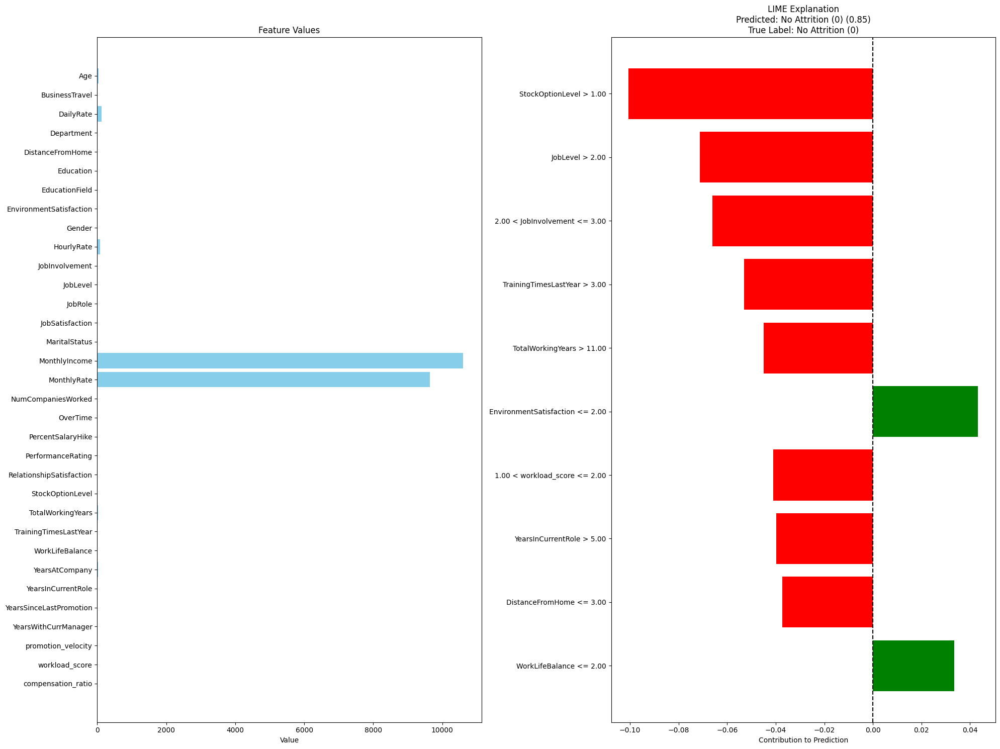

In [54]:
plot_lime_explanation(rf, X_test.iloc[1], lime_explainer, feature_names, class_names)

*   **Green Bars (Supporting "No Attrition"):** Features pushing the prediction *towards* retention.
    *   `EnvironmentSatisfaction <= 2.00` (Strongest Positive): Low environment satisfaction is identified as the strongest reason the model predicts this employee will stay.
    *   `WorkLifeBalance <= 2.00` (Moderate Positive): Low work-life balance also supports the retention prediction.

*   **Red Bars (Opposing "No Attrition" / Supporting "Attrition"):** Features pushing the prediction *away* from retention and *towards* attrition.
    *   `StockOptionLevel > 1.00` (Strongest Negative): High stock options argue most strongly *against* retention (push towards attrition).
    *   `JobLevel > 2.00` (Strong Negative): High job level argues strongly against retention.
    *   `2.00 < JobInvolvement <= 3.00` (Moderate Negative): Mid-range job involvement argues against retention.
    *   `TrainingTimesLastYear > 3.00` (Moderate Negative): More training argues against retention.
    *   `TotalWorkingYears > 11.00` (Moderate Negative): Longer tenure argues against retention.
    *   `1.00 < workload_score <= 2.00` (Moderate Negative): Low workload argues against retention.
    *   `YearsInCurrentRole > 5.00` (Slight Negative): Longer time in role argues slightly against retention.
    *   `DistanceFromHome <= 3.00` (Slight Negative): Living close argues slightly against retention.


The model correctly predicts this employee will not leave. However, most of the LIME explanations are counter-intuitive.  Repeatedly counter-intuitive results across cases suggest the Random Forest’s logic may need more investigation into the Random Forest model behavior.

## SHAP Analysis

In [56]:
explainer = shap.TreeExplainer(rf)

print(f"Calculating SHAP values for X_test (shape: {X_test.shape})...")
shap_values = explainer.shap_values(X_test)
shap_values

Calculating SHAP values for X_test (shape: (458, 33))...


array([[[-0.04560284,  0.04560284],
        [ 0.02898328, -0.02898328],
        [ 0.04159416, -0.04159416],
        ...,
        [-0.00127295,  0.00127295],
        [ 0.07857812, -0.07857812],
        [ 0.00738526, -0.00738526]],

       [[ 0.03469977, -0.03469977],
        [ 0.00707523, -0.00707523],
        [ 0.01260348, -0.01260348],
        ...,
        [-0.00447657,  0.00447657],
        [ 0.03702456, -0.03702456],
        [-0.01398578,  0.01398578]],

       [[-0.0334418 ,  0.0334418 ],
        [ 0.01389793, -0.01389793],
        [ 0.00131711, -0.00131711],
        ...,
        [ 0.07551528, -0.07551528],
        [ 0.02609073, -0.02609073],
        [ 0.00634864, -0.00634864]],

       ...,

       [[-0.03087943,  0.03087943],
        [ 0.00568094, -0.00568094],
        [ 0.00963033, -0.00963033],
        ...,
        [-0.00586607,  0.00586607],
        [-0.03469311,  0.03469311],
        [ 0.00671716, -0.00671716]],

       [[-0.01709996,  0.01709996],
        [ 0.01055347, -0.01

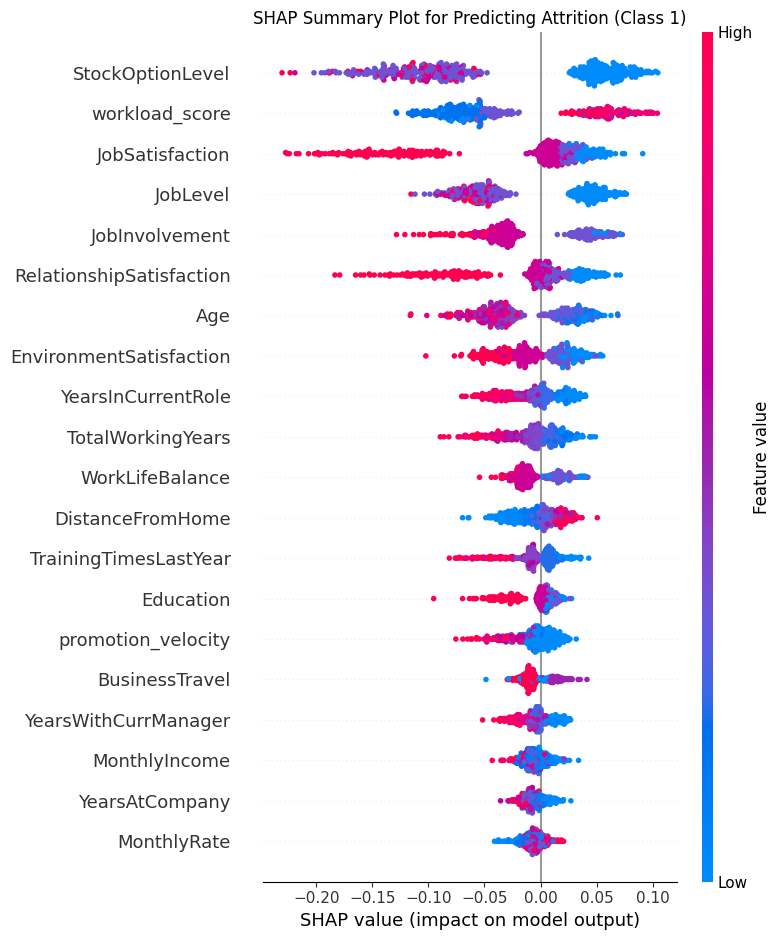

In [65]:
plt.figure(figsize=(13, 8))
shap.summary_plot(
    shap_values[:, :, 1],
    X_test,
    show=False
)
plt.title("SHAP Summary Plot for Predicting Attrition (Class 1)")
plt.tight_layout()
plt.show()

* **Y-axis:** Features ranked by global importance (top = greater overall impact).
* **X-axis:** SHAP values per instance; right (positive) = pushes toward * attrition, left (negative) = pushes toward no attrition.
* **Color:** Red = high feature value, Blue = low.
* **Spread:** Wider horizontal spread -> broader range of impacts for that feature.

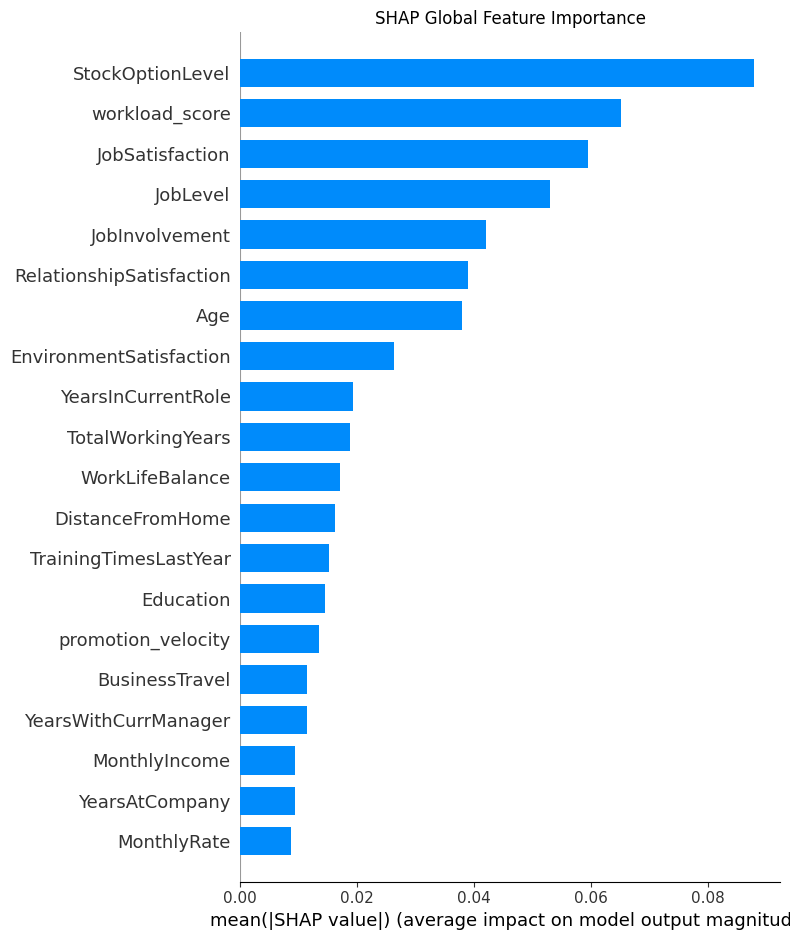

In [66]:
plt.figure(figsize=(13, 8))
shap.summary_plot(
    shap_values[:, :, 1],
    X_test,
    plot_type="bar",
    show=False
)
plt.title("SHAP Global Feature Importance")
plt.tight_layout()
plt.show()

* **Vertical Axis:** Features
* **Horizontal Axis:** Mean absolute SHAP value (mean(|SHAP value|)) across all instances in X_test. This represents the average impact magnitude of a feature on the model's output prediction, regardless of direction.

